In [20]:
from copy import deepcopy
import cv2
import matplotlib.pyplot as plt
import numpy as np
from random import randint
from skimage.color import rgb2gray, gray2rgb
from skimage.io import imread
import skimage.transform as sktr
import warnings

warnings.filterwarnings("ignore")
%matplotlib inline

In [21]:
DPI = 80


def plot(img, gray = True):
    """
    Help function to plot image in jupyter notebook
    :param img: image to plot
    :param gray: if true means that image is gray and we need do use another method to plot it
    """
    height, width = img.shape[:2]
    fig = plt.figure(figsize=(width / DPI, height / DPI))
    if gray:
        plt.imshow(img, cmap='gray', interpolation='bicubic')
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), interpolation='bicubic')
    plt.xticks([])
    plt.yticks([])
    plt.show()

In [22]:
def scale(img, fh, fw):
    """
    Scales the image proportionally \a fh and \a fw
    :param img: image to scale
    :param fh: vertical scale ratio
    :param fw: horizontal scale ratio
    :return: scaled image
    """
    height, width = img.shape[:2]
    return cv2.resize(img,(int(width*fw), int(height*fh)), interpolation=cv2.INTER_CUBIC)


def rotate(img, angle):
    """
    Rotate the image at an angle
    :param img: image to rotate
    :param angle
    :return: rotated image
    """
    rows, cols = img.shape
    M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
    return cv2.warpAffine(img, M, (cols, rows))


def add_noise(img, salt_prob = 0.0, pepper_prob = 0.0):
    """
    Adds noise to the image where \a salt_prob and \a pepper_prob are noise probability
    :param img: image to noise
    :param salt_prob: probability to add a salt
    :param pepper_prob: probability to add a pepper
    :return: noised image
    """
    new_img = deepcopy(img)
    salt_mask = np.random.rand(*img.shape) < salt_prob
    pepper_mask = np.random.rand(*img.shape) < pepper_prob
    new_img[salt_mask] = 1
    new_img[pepper_mask] = 0
    return new_img

In [23]:
def match(img1, img2, method):
    """
    Detects feature with given method and then performs. Available methos: ["sift", "surf", "kaze"]
    :param img1: image to search
    :param img2: image inside which to search
    :param method: feature detector (sift, surf, kaze)
    """
    detector = None
    if method == 'sift':
        detector = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        detector = cv2.xfeatures2d.SURF_create()
    elif method == 'kaze':
        detector = cv2.KAZE_create()
    else:
        raise Exception('Unknown method. Must be sift, surf or kaze.')
    
    # Find the keypoints and descriptors
    kp1, des1 = detector.detectAndCompute(img1, None)
    kp2, des2 = detector.detectAndCompute(img2, None)
    
    # create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    # Match descriptors and sort matches in the order of their distance
    matches = bf.match(des1, des2)
    matches = sorted(matches, key = lambda x: x.distance)
    
    # Print counts of keypoints and matches
    print('len(kp1) =', len(kp1))
    print('len(kp2) =', len(kp2))
    print(len(matches), 'matches found')
        
    # Draw first 10 matches.
    img_with_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:10], None, flags=2)
    plot(img_with_matches)

SIFT
len(kp1) = 1478
len(kp2) = 2441
675 matches found


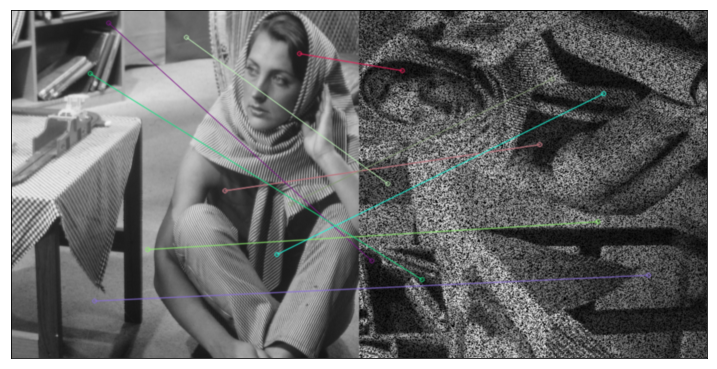

SURF
len(kp1) = 2030
len(kp2) = 7183
632 matches found


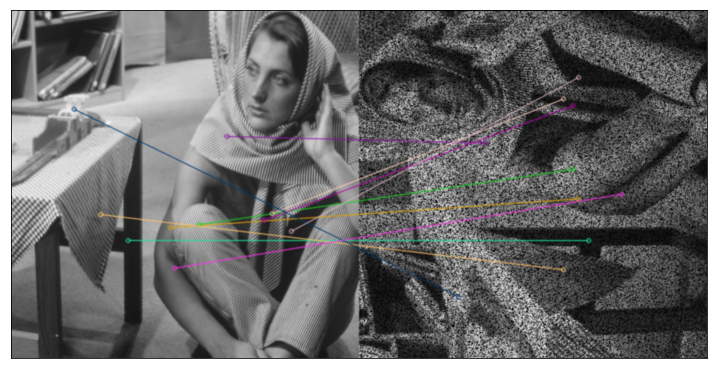

KAZE
len(kp1) = 751
len(kp2) = 1605
468 matches found


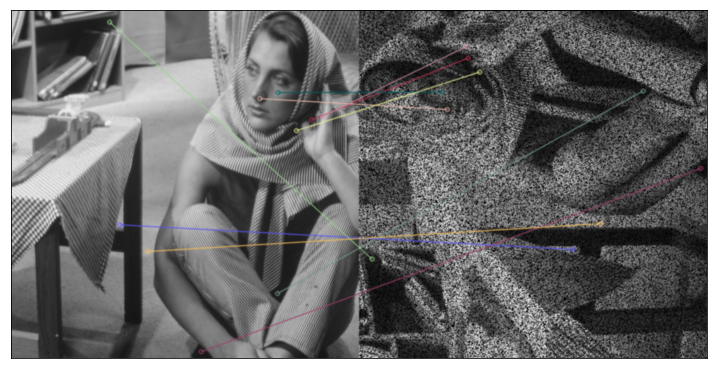

In [24]:
# Read image
img = cv2.cvtColor(cv2.imread('images/barbara.png'), cv2.COLOR_BGR2GRAY)
# img1 = scale(img, 0.8, 1.2)
img1 = rotate(img, 90)
img1 = add_noise(img1, 0.2, 0.2)

print('SIFT')
match(img, img1, 'sift')
print('SURF')
match(img, img1, 'surf')
print('KAZE')
match(img, img1, 'kaze')

In [25]:
def detect(img1, img2, method = 'sift', MIN_MATCH_COUNT = 10):
    """
    Finds instance of img1 in img2 with specified feature detector. Available methos: ["sift", "surf", "kaze"]
    :param img1: image to search
    :param img2: image inside which to search
    :param method: feature detector (sift, surf, kaze)
    :param MIN_MATCH_COUNT: minimum required numer of good matches
    """
    
    # Initiate detector
    detector = None
    if method == 'sift':
        detector = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        detector = cv2.xfeatures2d.SURF_create()
    elif method == 'kaze':
        detector = cv2.KAZE_create()
    else:
        raise Exception('Unknown method. Must be sift, surf or kaze.')

    # Find the keypoints and descriptors
    kp1, des1 = detector.detectAndCompute(img1, None)
    kp2, des2 = detector.detectAndCompute(img2, None)
    
    # Search matches
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des1, des2, k = 2)
    
    # Print counts of keypoints and matches
    print('len(kp1) =', len(kp1))
    print('len(kp2) =', len(kp2))
    print(len(matches), 'matches found')
    
    # Store all the good matches as per Lowe's ratio test.
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)

    if len(good) > MIN_MATCH_COUNT:
        # Find matrix of homography
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        matchesMask = mask.ravel().tolist()
        
        # Creating a border of first image and transform it by using matrix of homography
        h,w = img1.shape
        pts = np.float32([ [0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,M)
        new_img2 = cv2.polylines(deepcopy(img2), [np.int32(dst)], True, 255, 3, cv2.LINE_AA)
    else:
        print( "Not enough matches found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
        matchesMask = None
        
    # Draw green matches on image    
    draw_params = dict(matchColor = (0, 255, 0), # draw matches in green color
                       singlePointColor = None,
                       matchesMask = matchesMask, # draw only inliers
                       flags = 2)
    img3 = cv2.drawMatches(img1, kp1, new_img2, kp2, good, None, **draw_params)
    plot(img3)

SIFT
len(kp1) = 924
len(kp2) = 3446
924 matches found


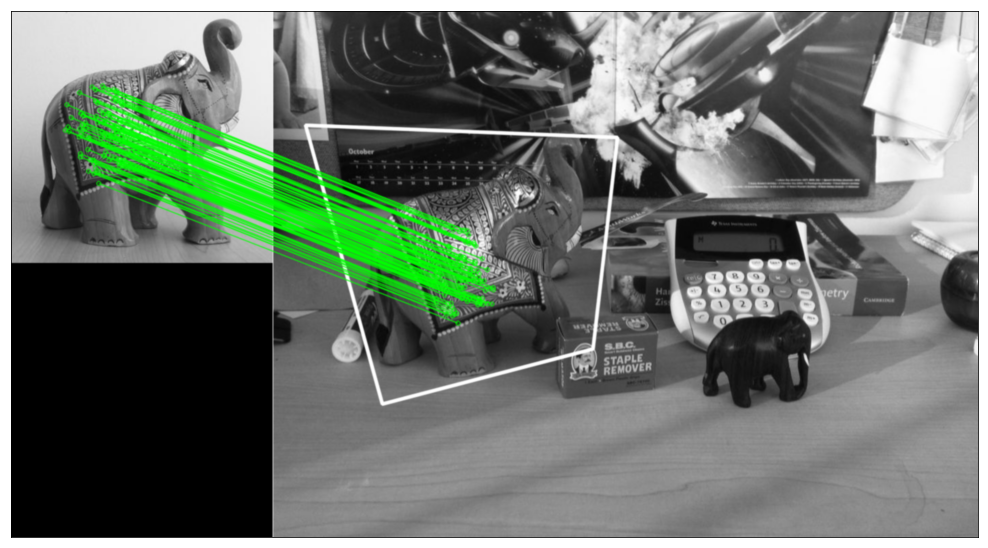

SURF
len(kp1) = 1061
len(kp2) = 4215
1061 matches found


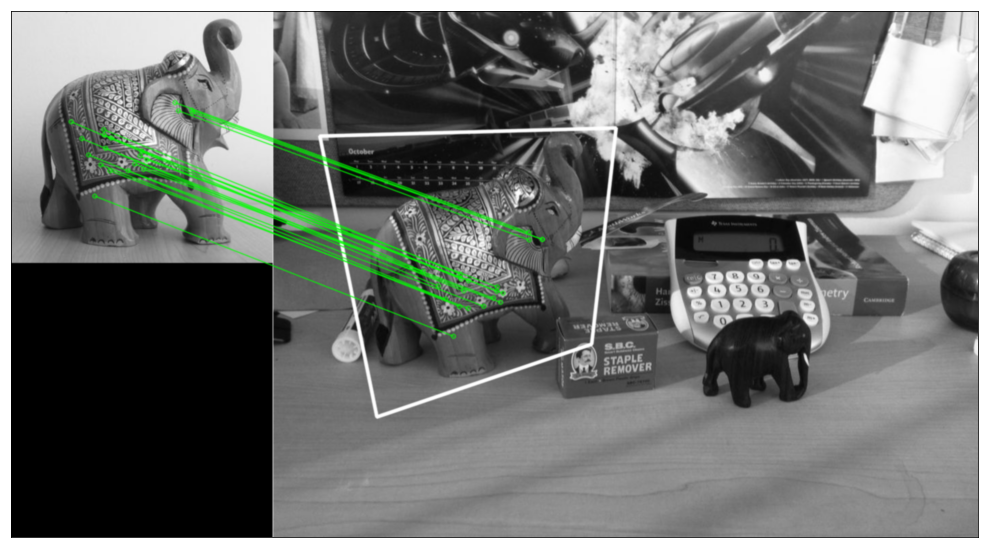

KAZE
len(kp1) = 580
len(kp2) = 2806
580 matches found


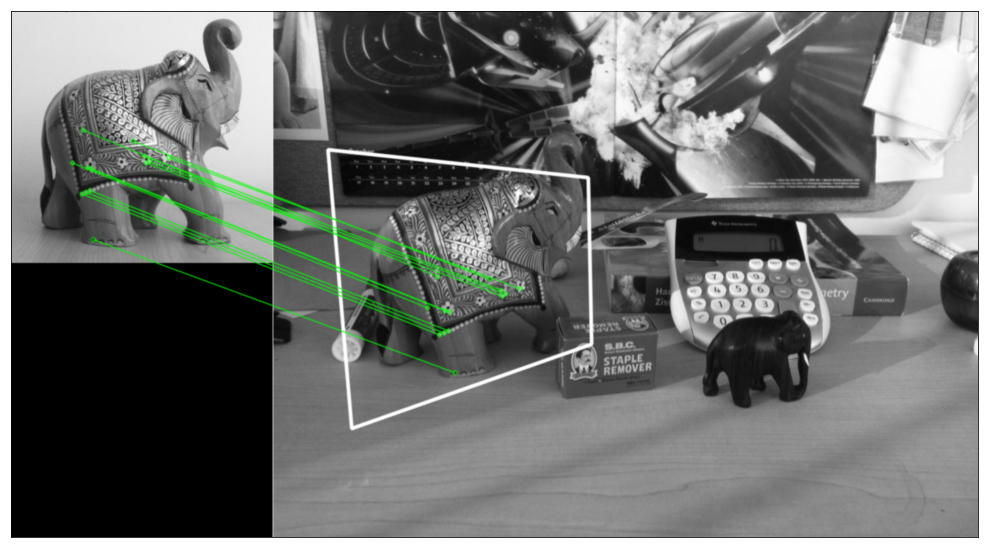

In [26]:
img1 = cv2.imread('images/needle2.png', 0)  # queryImage
img2 = cv2.imread('images/hay.png', 0)      # trainImage

print('SIFT')
detect(img1, img2, 'sift')

print('SURF')
detect(img1, img2, 'surf')

print('KAZE')
detect(img1, img2, 'kaze')

In [27]:
def warpImages(imageLeft, imageRight, H):
    """
    Transforms the first image relative to the second image by homography matrix. 
    This function create a canvas with space for both images and move them to right position.
    :param imageLeft: image to transform
    :param imageRight: lead picture
    :param H: homography matrix of the first image to the second
    :return: concatenated image
    """
    rows1, cols1 = imageRight.shape[:2]
    rows2, cols2 = imageLeft.shape[:2]

    # Get a new borders of transformed image
    list_of_points_1 = np.float32([[0,0], [0, rows1], [cols1, rows1], [cols1, 0]]).reshape(-1,1,2)
    temp_points = np.float32([[0, 0], [0, rows2], [cols2, rows2], [cols2, 0]]).reshape(-1,1,2)
    list_of_points_2 = cv2.perspectiveTransform(temp_points, H)
    list_of_points = np.concatenate((list_of_points_1, list_of_points_2), axis = 0)

    # Before concatenation of images we want to move them below, to have space for both images
    [x_min, y_min] = np.int32(list_of_points.min(axis = 0).ravel() - 0.5)
    [x_max, y_max] = np.int32(list_of_points.max(axis = 0).ravel() + 0.5)
    translation_dist = [-x_min, -y_min]
    H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

    # Transfom the first image to the second. Before transform we need to move H matrix first by H_translation.dot(H)
    output_img = cv2.warpPerspective(imageLeft, H_translation.dot(H), (x_max - x_min, y_max - y_min))
    # Add a second image to the canvas
    output_img[translation_dist[1]:rows1 + translation_dist[1], translation_dist[0]:cols1 + translation_dist[0]] = imageRight
    
    return output_img

In [28]:
MAX_FEATURES = 500
GOOD_MATCH_PERCENT = 0.15


def alignImages(img1, img2, method='sift'):   
    """
    Align the first image relative to the second image. Available methos: ["sift", "surf", "kaze"]
    :param img1: image to transform
    :param img2: lead picture
    :param method: feature detector (sift, surf, kaze)
    :return: concatenated image, matrix of homography
    """
    # Initiate detector
    detector = None
    if method == 'sift':
        detector = cv2.xfeatures2d.SIFT_create(MAX_FEATURES)
    elif method == 'surf':
        detector = cv2.xfeatures2d.SURF_create(MAX_FEATURES)
    elif method == 'kaze':
        detector = cv2.KAZE_create()
    else:
        raise Exception('Unknown method. Must be sift, surf or kaze.')

    # Find the keypoints and descriptors
    kp1, des1 = detector.detectAndCompute(img1, None)
    kp2, des2 = detector.detectAndCompute(img2, None)
    
    # create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    # Match descriptors and sort matches in the order of their distance
    matches = bf.match(des1, des2)
  
    # Sort matches by score
    matches.sort(key=lambda x: x.distance, reverse=False)

    # Remove not so good matches
    numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
    matches = matches[:numGoodMatches]
    
    # Print counts of keypoints and matches
    print('len(kp1) =', len(kp1))
    print('len(kp2) =', len(kp2))
    print(len(matches), 'matches found')

    # Draw top matches
    imMatches = cv2.drawMatches(img1, kp1, img2, kp2, matches, None)
    plot(imMatches, gray=False)

    # Extract location of good matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = kp1[match.queryIdx].pt
        points2[i, :] = kp2[match.trainIdx].pt

    # Find homography
    M, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

    # Concatenate images
    result = warpImages(img1, img2, M);
    return result, M

SIFT
len(kp1) = 500
len(kp2) = 500
33 matches found


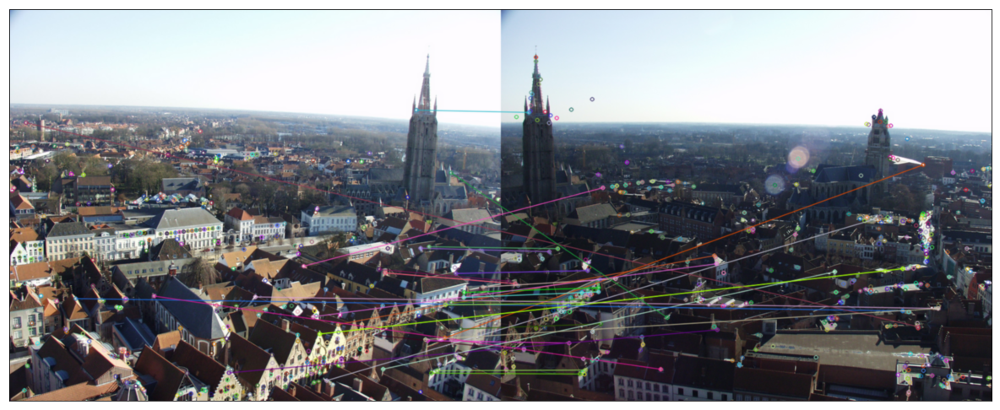

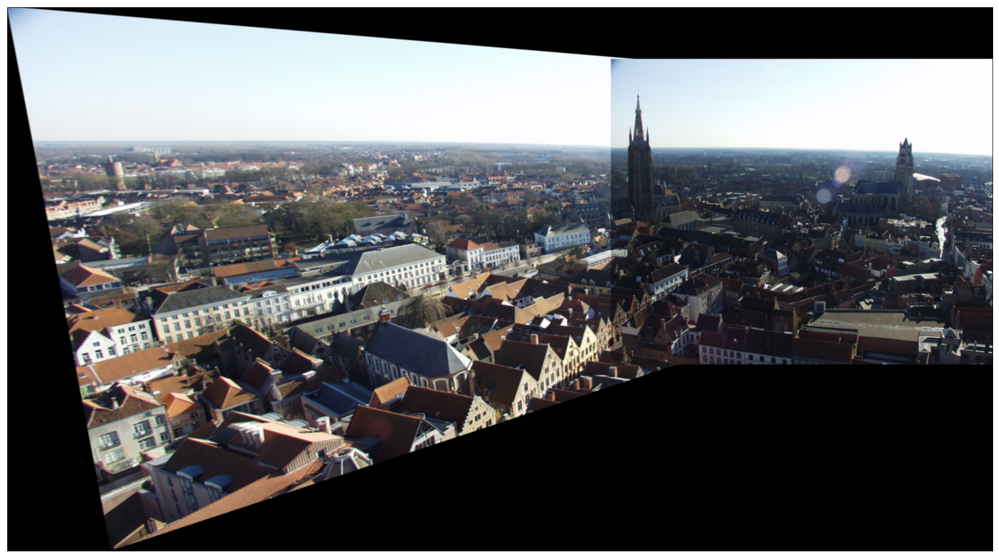

SURF
len(kp1) = 3756
len(kp2) = 1621
156 matches found


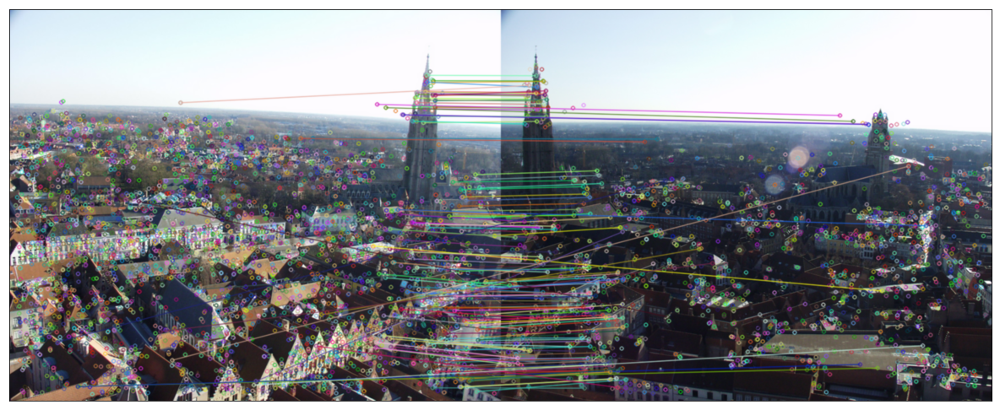

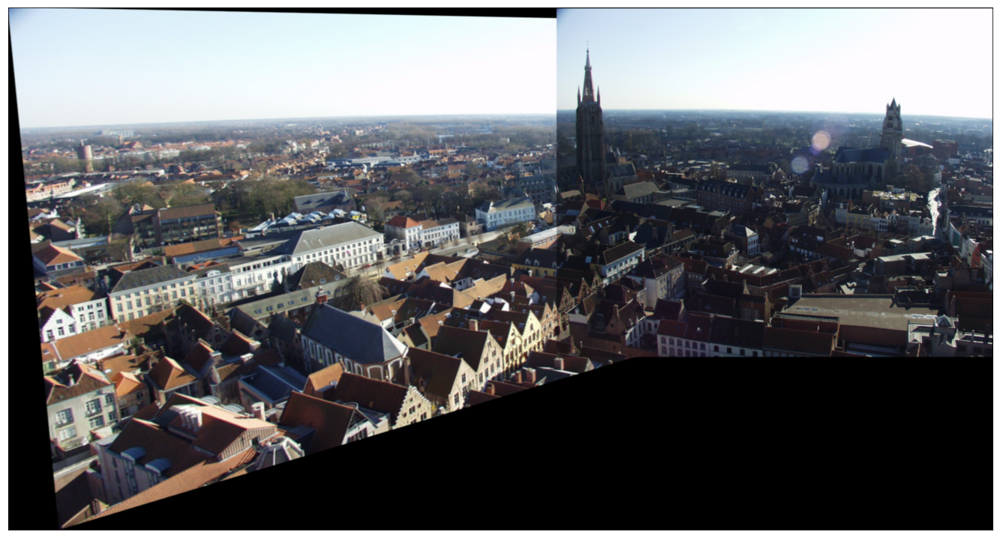

KAZE
len(kp1) = 4301
len(kp2) = 1668
158 matches found


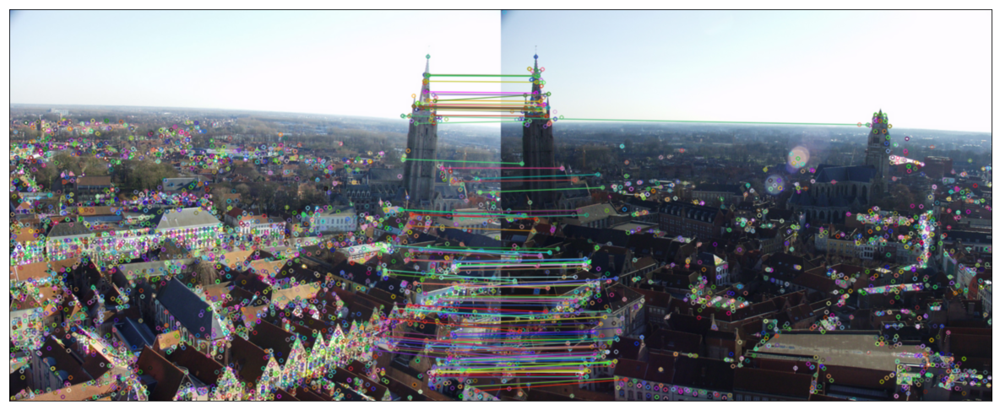

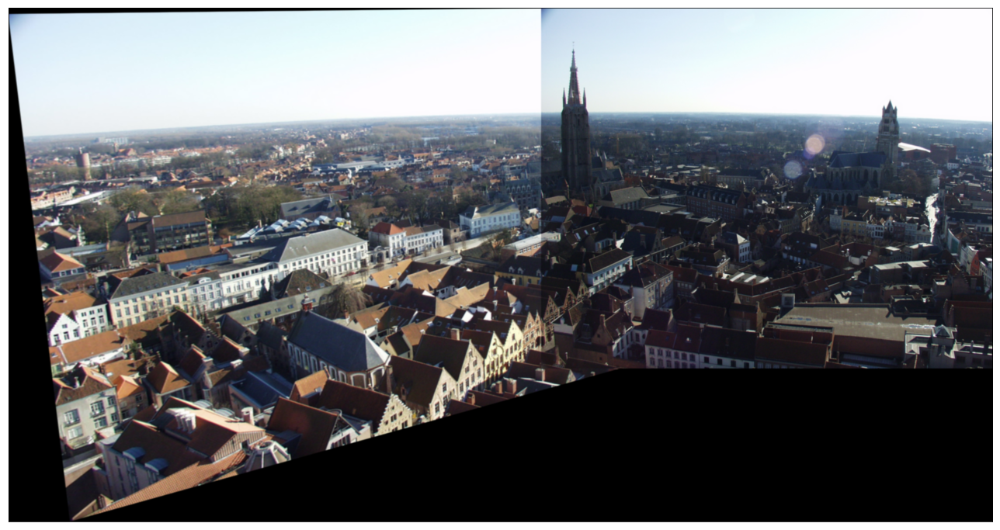

In [29]:
def register(img1, img2, method='sift'):
    imReg, hom_matrix = alignImages(img1, img2, method)
    plot(imReg, gray=False)

img1 = cv2.imread('images/tower1.png', cv2.IMREAD_COLOR)
img2 = cv2.imread('images/tower2.png', cv2.IMREAD_COLOR)

print('SIFT')
register(img1, img2, 'sift')

print('SURF')
register(img1, img2, 'surf')

print('KAZE')
register(img1, img2, 'kaze')